In [ ]:
import gc
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd 
import pickle
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from xgboost import XGBClassifier

In [ ]:
data_path = './kaggle/input/geolifeclef-2024'
output_path = './kaggle/working'

# Loading and examining the input data

## Metadata

In [ ]:
# Load the PA metadata for the training set
pa_metadata_train_csv_filename = data_path + '/GLC24_PA_metadata_train.csv'
pa_metadata_train_df = pd.read_csv(pa_metadata_train_csv_filename)

In [ ]:
pa_metadata_train_df.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,speciesId,surveyId
0,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,6874.0,212
1,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,476.0,212
2,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,11157.0,212
3,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,8784.0,212
4,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,4530.0,212


The metadata csv file contains the results of approximately 90,000 surveys of the European flora.

In [ ]:
# Get information about each survey for plotting locations, including the number
# of each species found in each survey
pa_survey_metadata_train_df = (pa_metadata_train_df
                               .copy()
                               .drop_duplicates('surveyId'))
pa_survey_metadata_train_df.drop('speciesId', axis=1, inplace=True)
pa_survey_metadata_train_df['speciesCount'] = (pa_metadata_train_df
                                        .groupby('surveyId')
                                        .count()
                                        .speciesId
                                        .tolist())

In [ ]:
pa_survey_metadata_train_df.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,surveyId,speciesCount
0,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,212,16
16,9.884560,56.912140,2017,10.0,79.0,CONTINENTAL,Denmark,222,5
21,8.256020,55.637050,2019,10.0,79.0,ATLANTIC,Denmark,243,14
35,-0.402590,43.505630,2018,1.0,NaN,ATLANTIC,France,324,6
41,-0.517360,45.806430,2017,1.0,NaN,ATLANTIC,France,333,9


In [208]:
# Create colour palette for plotting
notebook_colours = mpl.colormaps['Set2'](range(8))
notebook_colours = [mpl.colors.to_hex(c) for c in notebook_colours]

In [209]:
# Measure the size of each survey
survey_size_count = pa_metadata_train_df.surveyId.value_counts().value_counts()

# Measure the number of times species were observed via the surveys
species_obs_count = pa_metadata_train_df.speciesId.value_counts().value_counts()

# Count the number of times species appear in a single survey
species_survey_count = pa_metadata_train_df.value_counts(['surveyId', 'speciesId'])

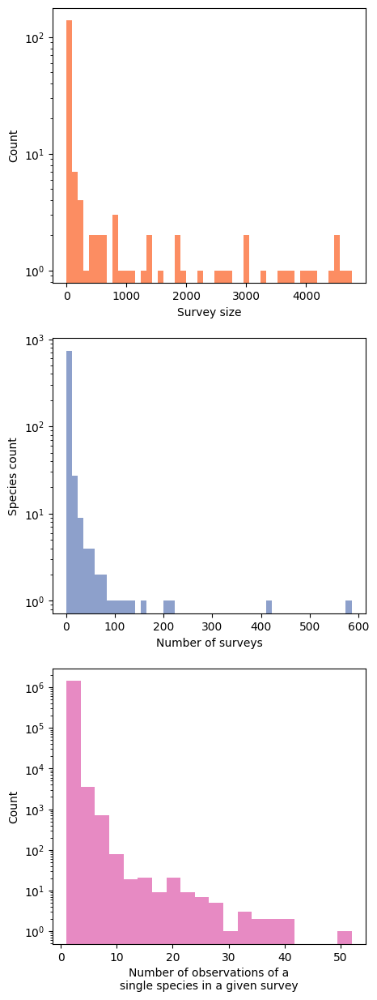

In [210]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(5, 15))

ax1.hist(survey_size_count,
         bins=50, 
         log=True, 
         color=notebook_colours[1])
ax1.set_xlabel("Survey size")
ax1.set_ylabel("Count")

ax2.hist(species_obs_count,
         bins=50, 
         log=True, 
         color=notebook_colours[2])
ax2.set_xlabel("Number of surveys")
ax2.set_ylabel("Species count")

ax3.hist(species_survey_count,
         bins=20,
         log=True,
         color=notebook_colours[3])
ax3.set_xlabel("Number of observations of a\nsingle species in a given survey")
ax3.set_ylabel("Count")

plt.show()

In [211]:
n_unique_species = pa_metadata_train_df.speciesId.nunique()
min_species_id = pa_metadata_train_df.speciesId.min()
max_species_id = pa_metadata_train_df.speciesId.max()

print(f"No. of unique species ids: {n_unique_species}")
print(f"Min species id: {min_species_id}")
print(f"Max species id: {max_species_id}")

No. of unique species ids: 5016
Min species id: 2.0
Max species id: 11254.0


<Axes: xlabel='year'>

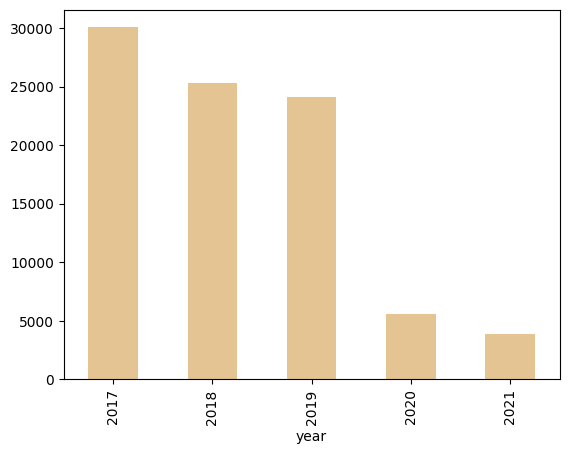

In [212]:
pa_survey_metadata_train_df.year.value_counts().plot.bar(color=notebook_colours[6])

In [213]:
# Create dictionary linking regions to colours
regions = pa_metadata_train_df.region.unique().tolist()
region_colour_pairs = zip(regions, notebook_colours)
region_colour_dict = {name: colour for (name, colour) in region_colour_pairs}

<Axes: title={'center': 'Number of surveys by region'}, xlabel='Region', ylabel='No. of surveys'>

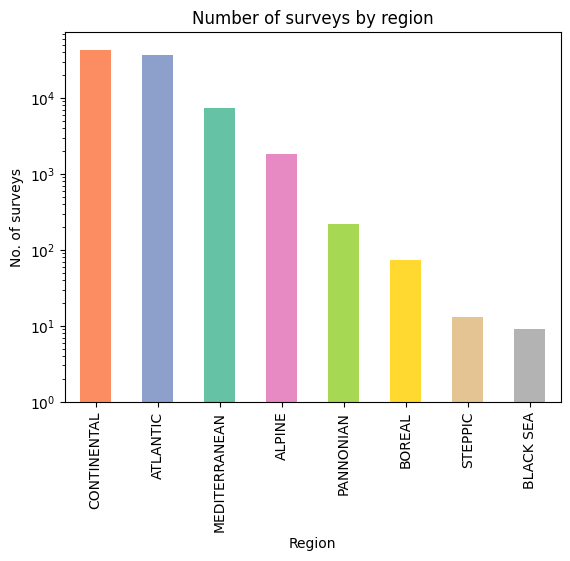

In [214]:
# Create bar chart of regions
region_counts = pa_survey_metadata_train_df.region.value_counts()
notebook_colours = [region_colour_dict[r] for r in region_counts.index]
region_counts.plot.bar(title='Number of surveys by region',
                       xlabel='Region', 
                       ylabel='No. of surveys', 
                       color=notebook_colours, 
                       log=True)

In [215]:
# Create a GeoDataFrame for plotting geospatial information about the PA surveys
pa_survey_metadata_train_gdf = gpd.GeoDataFrame(pa_survey_metadata_train_df,
                                                geometry=gpd.points_from_xy(pa_survey_metadata_train_df.lon,
                                                                            pa_survey_metadata_train_df.lat),
                                                crs='EPSG:4326')

In [216]:
# Plot a sample the locations of the presence-absence surveys. The colour of each
# dot represents the number of species found in the survey
sample_size = 2000
test_data = pa_survey_metadata_train_gdf.sample(sample_size)
test_data_colours = [region_colour_dict[r] for r in test_data.region.sort_values().unique()]
test_data.explore(column='region', 
                  cmap=test_data_colours,
                  tiles="CartoDB positron")

## Environmental rasters

In [9]:
# Set up the environmental raster file paths
climate_raster_path = data_path + '/EnvironmentalRasters/EnvironmentalRasters/Climate'
elevation_raster_path = data_path + '/EnvironmentalRasters/EnvironmentalRasters/Elevation'
human_raster_path = data_path + '/EnvironmentalRasters/EnvironmentalRasters/Human Footprint'
land_cover_raster_path = data_path + '/EnvironmentalRasters/EnvironmentalRasters/LandCover'
soil_grid_raster_path = data_path + '/EnvironmentalRasters/EnvironmentalRasters/SoilGrids'

In [218]:
# Load the climate raster csv file
average_climate_raster_train_csv_filename = (climate_raster_path + 
                                             '/Average 1981-2010/GLC24-PA-train-bioclimatic.csv')
monthly_climate_raster_train_csv_filename = (climate_raster_path + 
                                             '/Monthly/GLC24-PA-train-bioclimatic_monthly.csv')

average_climate_raster_train_df = pd.read_csv(average_climate_raster_train_csv_filename)
monthly_climate_raster_train_df = pd.read_csv(monthly_climate_raster_train_csv_filename)

In [219]:
average_climate_raster_train_df.head()

,surveyId,Bio1,Bio2,Bio3,Bio4,Bio5,Bio6,Bio7,Bio8,Bio9,Bio10,Bio11,Bio12,Bio13,Bio14,Bio15,Bio16,Bio17,Bio18,Bio19
0,212,2883,68,3,5545,3007,2780,227,2854,2958,2958,2816,6355,933,143,395,2282,770,770,1917
1,222,2815,59,2,5690,2935,2720,215,2860,2768,2890,2746,7286,792,376,201,2283,1336,2076,1653
2,243,2821,26,1,5150,2910,2741,169,2838,2832,2888,2759,8546,1117,372,295,2986,1438,2448,1838
3,324,2870,90,3,5315,2992,2756,236,2810,2938,2938,2802,10719,1163,564,197,3216,1948,1948,2926
4,333,2858,81,3,5285,2982,2758,224,2827,2927,2927,2792,9353,1095,503,249,3186,1638,1638,2677


In [220]:
monthly_climate_raster_train_df.head()

,surveyId,Bio-pr_01_2000,Bio-tas_01_2000,Bio-tasmax_01_2000,Bio-tasmin_01_2000,Bio-pr_02_2000,Bio-tas_02_2000,Bio-tasmax_02_2000,Bio-tasmin_02_2000,Bio-pr_03_2000,...,Bio-tasmax_10_2018,Bio-tasmin_10_2018,Bio-pr_11_2018,Bio-tas_11_2018,Bio-tasmax_11_2018,Bio-tasmin_11_2018,Bio-pr_12_2018,Bio-tas_12_2018,Bio-tasmax_12_2018,Bio-tasmin_12_2018
0,212,5872,2801,2828,2773,1229,2834,2860,2796,1184,...,2925,2872,7830,2862,2884,2836,4271,2839,2865,2810
1,222,4998,2765,2783,2740,6591,2769,2790,2745,6000,...,2861,2810,3787,2791,2809,2777,6133,2773,2786,2756
2,243,5387,2776,2787,2765,8123,2776,2785,2765,5518,...,2861,2837,4348,2805,2815,2795,9243,2787,2795,2776
3,324,1567,2777,2817,2739,9315,2830,2868,2780,10298,...,2927,2837,8789,2833,2879,2797,5142,2826,2861,2795
4,333,2085,2780,2810,2752,10213,2813,2845,2774,3199,...,2924,2839,9468,2824,2861,2799,13480,2818,2846,2794


In [221]:
# Check for any missing values
print(average_climate_raster_train_df.isnull().any(axis=1).sum())
print(monthly_climate_raster_train_df.isnull().any(axis=1).sum())

0
0


In [222]:
pa_elevation_train_csv_filename = (elevation_raster_path + 
                                   '/GLC24-PA-train-elevation.csv')

pa_elevation_train_df = pd.read_csv(pa_elevation_train_csv_filename)

In [223]:
pa_elevation_train_df.head()

,surveyId,Elevation
0,212,47.0
1,222,6.0
2,243,10.0
3,324,116.0
4,333,84.0


In [224]:
# Check for any missing values
print(pa_elevation_train_df.isnull().any(axis=1).any())

True


In [225]:
pa_elevation_train_df['has_missing'] = pa_elevation_train_df.isnull().any(axis=1)

In [226]:
# Plot location of missing values
pa_elevation_train_gdf = pa_survey_metadata_train_gdf[['surveyId', 'geometry']].copy()
pa_elevation_train_gdf = pd.merge(pa_elevation_train_gdf,
                                  pa_elevation_train_df[['surveyId', 'has_missing']],
                                  how='left',
                                  on='surveyId')

elevation_not_missing_gdf = pa_elevation_train_gdf.loc[~pa_elevation_train_gdf.has_missing]
elevation_missing_gdf = pa_elevation_train_gdf.loc[pa_elevation_train_gdf.has_missing]

elevation_not_missing_sample_size = 2000
elevation_missing_plot_gdf = pd.concat([elevation_not_missing_gdf.sample(elevation_not_missing_sample_size),
                                       elevation_missing_gdf])

elevation_missing_plot_gdf.explore(column='has_missing',
                                   cmap=[notebook_colours[1], notebook_colours[0]],
                                   tiles="CartoDB positron")

In [227]:
pa_human_train_csv_filename = (human_raster_path + 
                               '/GLC24-PA-train-human_footprint.csv')

pa_human_train_df = pd.read_csv(pa_human_train_csv_filename)

In [228]:
pa_human_train_df.head()

,surveyId,HumanFootprint-Built1994,HumanFootprint-Built2009,HumanFootprint-croplands1992,HumanFootprint-croplands2005,HumanFootprint-Lights1994,HumanFootprint-Lights2009,HumanFootprint-NavWater1994,HumanFootprint-NavWater2009,HumanFootprint-Pasture1993,HumanFootprint-Pasture2009,HumanFootprint-Popdensity1990,HumanFootprint-Popdensity2010,HumanFootprint-Railways,HumanFootprint-Roads,HumanFootprint-HFP1993,HumanFootprint-HFP2009
0,212,0.0,0.0,7.0,7.0,6.0,6.0,0.0,0.0,0.0,0.0,6.0,7.0,0.0,0.0,20.0,21.0
1,222,0.0,0.0,3.5,7.0,1.0,1.0,0.0,0.0,0.0,0.0,7.0,7.0,4.0,2.0,10.0,17.0
2,243,0.0,0.0,7.0,0.0,4.0,2.0,0.0,0.0,0.0,0.0,4.0,4.0,0.0,0.0,15.0,6.0
3,324,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,4.0,0.0,4.0,9.0,15.0
4,333,0.0,0.0,7.0,7.0,1.0,4.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,13.0,16.0


In [229]:
# Check for any missing values
pa_human_train_df.isnull().any(axis=1).sum()

5325

In [230]:
pa_human_train_df['has_missing'] = pa_human_train_df.isnull().any(axis=1)

In [231]:
# Plot location of missing values
pa_human_train_gdf = pa_survey_metadata_train_gdf[['surveyId', 'geometry']].copy()
pa_human_train_gdf = pa_human_train_gdf.merge(pa_human_train_df[['surveyId', 'has_missing']],
                                                      how='left',
                                                      on='surveyId')

human_not_missing_gdf = pa_human_train_gdf.loc[~pa_human_train_gdf.has_missing]
human_missing_gdf = pa_human_train_gdf.loc[pa_human_train_gdf.has_missing]

human_not_missing_sample_size = 3000
human_missing_plot_gdf = pd.concat([human_not_missing_gdf.sample(human_not_missing_sample_size),
                                       human_missing_gdf])

human_missing_plot_gdf.explore(column='has_missing',
                                   cmap=[notebook_colours[1], notebook_colours[0]],
                                   tiles="CartoDB positron")

In [232]:
pa_land_cover_train_csv_filename = (land_cover_raster_path + 
                                   '/GLC24-PA-train-landcover.csv')

pa_land_cover_train_df = pd.read_csv(pa_land_cover_train_csv_filename)

In [233]:
pa_land_cover_train_df.head()

,surveyId,LandCover
0,212,8.0
1,222,12.0
2,243,5.0
3,324,14.0
4,333,14.0


In [234]:
# Check for any missing values
pa_land_cover_train_df.isnull().any(axis=1).sum()

0

In [235]:
pa_soil_grid_train_csv_filename = (soil_grid_raster_path + 
                                   '/GLC24-PA-train-soilgrids.csv')

pa_soil_grid_train_df = pd.read_csv(pa_soil_grid_train_csv_filename)

In [236]:
pa_soil_grid_train_df.head()

,surveyId,Soilgrid-bdod,Soilgrid-cec,Soilgrid-cfvo,Soilgrid-clay,Soilgrid-nitrogen,Soilgrid-phh2o,Soilgrid-sand,Soilgrid-silt,Soilgrid-soc
0,212,140.0,214.0,151.0,292.0,159.0,73.0,284.0,422.0,176.0
1,222,120.0,225.0,101.0,94.0,379.0,58.0,650.0,255.0,609.0
2,243,115.0,261.0,86.0,131.0,373.0,54.0,750.0,117.0,672.0
3,324,118.0,179.0,117.0,225.0,230.0,57.0,238.0,535.0,302.0
4,333,138.0,233.0,176.0,328.0,250.0,71.0,231.0,439.0,257.0


In [237]:
# Check for any missing values
pa_soil_grid_train_df.isnull().any(axis=1).sum()

9913

In [238]:
pa_soil_grid_train_df['has_missing'] = pa_soil_grid_train_df.isnull().any(axis=1)

In [239]:
# Plot location of missing values
pa_soil_grid_train_gdf = pa_survey_metadata_train_gdf[['surveyId', 'geometry']].copy()
pa_soil_grid_train_gdf = pa_soil_grid_train_gdf.merge(pa_soil_grid_train_df[['surveyId', 'has_missing']],
                                                      how='left',
                                                      on='surveyId')

soil_grid_not_missing_gdf = pa_soil_grid_train_gdf.loc[~pa_soil_grid_train_gdf.has_missing]
soil_grid_missing_gdf = pa_soil_grid_train_gdf.loc[pa_soil_grid_train_gdf.has_missing]

soil_grid_not_missing_sample_size = 3000
soil_grid_missing_plot_gdf = pd.concat([soil_grid_not_missing_gdf.sample(soil_grid_not_missing_sample_size),
                                       soil_grid_missing_gdf])

soil_grid_missing_plot_gdf.explore(column='has_missing',
                                   cmap=[notebook_colours[1], notebook_colours[0]],
                                   tiles="CartoDB positron")

## Landsat Time Series

In [240]:
landsat_train_path = data_path + '/PA-train-landsat_time_series'

blue_landsat_train_csv_filename = landsat_train_path + '/GLC24-PA-train-landsat_time_series-blue.csv'
green_landsat_train_csv_filename = landsat_train_path + '/GLC24-PA-train-landsat_time_series-green.csv'
red_landsat_train_csv_filename = landsat_train_path + '/GLC24-PA-train-landsat_time_series-red.csv'
nir_landsat_train_csv_filename = landsat_train_path + '/GLC24-PA-train-landsat_time_series-nir.csv'
swir1_landsat_train_csv_filename = landsat_train_path + '/GLC24-PA-train-landsat_time_series-swir1.csv'
swir2_landsat_train_csv_filename = landsat_train_path + '/GLC24-PA-train-landsat_time_series-swir2.csv'

blue_landsat_train_df = pd.read_csv(blue_landsat_train_csv_filename)
green_landsat_train_df = pd.read_csv(green_landsat_train_csv_filename)
red_landsat_train_df = pd.read_csv(red_landsat_train_csv_filename)
nir_landsat_train_df = pd.read_csv(nir_landsat_train_csv_filename)
swir1_landsat_train_df = pd.read_csv(swir1_landsat_train_csv_filename)
swir2_landsat_train_df = pd.read_csv(swir2_landsat_train_csv_filename)

In [241]:
blue_landsat_train_df.head()

,surveyId,2000_1,2000_2,2000_3,2000_4,2001_1,2001_2,2001_3,2001_4,2002_1,...,2018_3,2018_4,2019_1,2019_2,2019_3,2019_4,2020_1,2020_2,2020_3,2020_4
0,212,6.0,6.0,4.0,5.0,6.0,5.0,4.0,5.0,6.0,...,7.0,6.0,7.0,6.0,8.0,6.0,7.0,6.0,6.0,6.0
1,222,6.0,5.0,6.0,7.0,6.0,7.0,6.0,7.0,6.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,243,6.0,5.0,6.0,9.0,5.0,4.0,5.0,6.0,6.0,...,5.0,4.0,8.0,3.0,4.0,4.0,NaN,NaN,NaN,NaN
3,324,12.0,16.0,6.0,5.0,11.0,19.0,6.0,8.0,11.0,...,6.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,333,10.0,7.0,12.0,7.0,11.0,23.0,27.0,12.0,8.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [242]:
red_landsat_train_df.columns[red_landsat_train_df.isnull().any(axis=0)]
green_landsat_train_df.columns[green_landsat_train_df.isnull().any(axis=0)]

Index(['2018_1', '2018_2', '2018_3', '2018_4', '2019_1', '2019_2', '2019_3',
       '2019_4', '2020_1', '2020_2', '2020_3', '2020_4'],
      dtype='object')

We need to understand how to deal with the missing values in the LandSat data. Looking at the form of the missing values, it appears as though the data are missing systematically. We look to compare the year in which the survey observation was made against the first quarter for which we do not have LandSat data for a given survey.

In [243]:
def first_null_q(n_null):
    quarters = [f"{year}_{q}" for year in list(range(2018, 2021)) for q in ["01", "02", "03", "04"]]
    if n_null > 0:
        return quarters[12 - n_null]
    else:
        return "2021_01"

In [244]:
blue_landsat_first_null_q = blue_landsat_train_df.isnull().sum(axis=1).apply(first_null_q)
blue_landsat_first_null_q = pd.concat([blue_landsat_train_df['surveyId'], blue_landsat_first_null_q], axis=1)
blue_landsat_first_null_q.rename({0: "first_null_q"}, axis=1, inplace=True)

blue_landsat_obs_date = pd.merge(blue_landsat_first_null_q,
                                 pa_survey_metadata_train_df[['surveyId', 'year']],
                                 on="surveyId")

In [245]:
blue_landsat_obs_date.value_counts(['year', 'first_null_q'], dropna=False)

year  first_null_q
2017  2018_01         30063
2018  2019_01         25286
2019  2020_01         24116
2020  2021_01          5606
2021  2021_01          3916
Name: count, dtype: int64

So for all observations taken through 2018-2020 we have the LandSat data up to the end of the year in which the observation was made. For observations from 2021, however, we only have the LandSat data until the start of the year. The same is true for the `green`, `red`, `nir`, `swir1` and `swir2` spectral bands.

## Satellite Patches

Dealing with the satellite patches requires knowledge of image processing. I will leave this for the time being and hopefully come back to this in the future and include it in the model.

# Data Manipulation

We want to create a single table containing information from the survey metadata, environmental raster data and the LandSat time series.

The first thing to do is to reshape the metadata dataframe.

In [246]:
# Initialize the species/survey matrix
pa_species_df = pd.DataFrame(0, 
                             index=pa_metadata_train_df.surveyId.unique(),
                             columns=list(range(1, int(max_species_id+1))))

In [247]:
# Drop duplicate (speciesId, surveyId) entries
pa_metadata = pa_metadata_train_df.drop_duplicates(['speciesId', 'surveyId']).copy()

# Change the speciesId dtype to int
pa_metadata['speciesId'] = pa_metadata['speciesId'].apply(int)

surveyId_map = {idx: i for i, idx in enumerate(pa_metadata.surveyId.unique())}

# Set the values in the species/survey matrix
pa_species_df.values[pa_metadata.surveyId.map(surveyId_map), 
                     pa_metadata.speciesId.apply(lambda x: x-1).tolist()] = 1

pa_species_df.reset_index(names='surveyId', inplace=True)

In [248]:
# Perform one-hot encoding for 'country' and 'region' variables
pa_survey_metadata_train_df = pd.merge(pa_survey_metadata_train_df,
                                       pd.get_dummies(pa_survey_metadata_train_df[['country', 'region']], dtype='int'),
                                       how='left',
                                       left_index=True,
                                       right_index=True)

In [249]:
# Combine the dataframes into a single, larger dataframe.

# To avoid any potential issues with data leakage I have cut off the monthly climate raster dataframe
# at the end of 2016.

monthly_climate_end_idx = 817

pa_train_df = pd.merge(pa_survey_metadata_train_df.drop(['areaInM2', 'geoUncertaintyInM'], axis=1),
                      monthly_climate_raster_train_df.iloc[:, 0:monthly_climate_end_idx],
                      how='left',
                      on='surveyId')

pa_train_df = pd.merge(pa_train_df,
                      average_climate_raster_train_df,
                      how='left',
                      on='surveyId')

pa_train_df = pd.merge(pa_train_df,
                       pa_elevation_train_df.drop('has_missing', axis=1),
                       how='left',
                       on='surveyId')

pa_train_df = pd.merge(pa_train_df,
                       pa_human_train_df.drop('has_missing', axis=1),
                       how='left',
                       on='surveyId')

pa_train_df = pd.merge(pa_train_df,
                       pa_land_cover_train_df,
                       how='left',
                       on='surveyId')

pa_train_df = pd.merge(pa_train_df,
                       pa_soil_grid_train_df.drop('has_missing', axis=1),
                       how='left',
                       on='surveyId')

In [27]:
def reindex_landsat_data(row, band, year_df):
    year = year_df.loc[year_df.surveyId == row.surveyId, "year"].values[0]
    start_idx = (year - 2017)*4 + 1
    end_idx = start_idx + 68
    obs = row[start_idx:end_idx]
    obs.index = [f"{band}_{lag}" for lag in list(range(68, 0, -1))]
    return obs

In [251]:
landsat_df_list = [blue_landsat_train_df,
                   green_landsat_train_df,
                   red_landsat_train_df,
                   nir_landsat_train_df,
                   swir1_landsat_train_df,
                   swir2_landsat_train_df]

landsat_bands = ['blue', 'green', 'red', 'nir', 'swir1', 'swir2']

for band, landsat_df in zip(landsat_bands, landsat_df_list):
    landsat_merge_df = landsat_df.apply(reindex_landsat_data,
                                        axis=1,
                                        band=band,
                                        year_df=pa_survey_metadata_train_df)
    pa_train_df = pd.merge(pa_train_df,
                           landsat_merge_df,
                           how='left',
                           left_index=True,
                           right_index=True)

In [252]:
# Perform spatial interpolation to fill missing values. I will do this by creating a grid and using
# the mean values from the grid boxes to fill any null values
lat_n_gridlines = 201
lon_n_gridlines = 201
lat_min = pa_survey_metadata_train_df.lat.min()
lat_max = pa_survey_metadata_train_df.lat.max()
lon_min = pa_survey_metadata_train_df.lon.min()
lon_max = pa_survey_metadata_train_df.lon.max()

# lat_gridlines = np.linspace(lat_min, lat_max, lat_n_gridlines)
# lon_gridlines = np.linspace(lon_min, lon_max, lon_n_gridlines)
lat_grid = pd.interval_range(lat_min, lat_max, periods=(lat_n_gridlines-1), closed='both')
lon_grid = pd.interval_range(lon_min, lon_max, periods=(lon_n_gridlines-1), closed='both')

In [253]:
def loc_to_grid_num(row):
    lat_num = np.array(range(lat_n_gridlines-1))[lat_grid.contains(row.lat)][0]
    lon_num = np.array(range(lon_n_gridlines-1))[lon_grid.contains(row.lon)][0]
        
    grid_num = lat_num*(lon_n_gridlines - 1) + lon_num
    return grid_num

In [254]:
pa_train_df['grid_num'] = pa_train_df.apply(loc_to_grid_num, axis=1)

grid_num_counts = pa_train_df['grid_num'].value_counts()
single_grid_locs = grid_num_counts.index[grid_num_counts == 1]

single_null_locations = pa_train_df.index[(pa_train_df.isnull().any(axis=1) & 
                                           pa_train_df.grid_num.isin(single_grid_locs))]

In [255]:
# Find the grid numbers which border the current one
def bordering_grid_nums(grid_num, lat_n_gridlines, lon_n_gridlines):
    n_rows = lat_n_gridlines - 1
    n_cols = lon_n_gridlines - 1
    
    if grid_num < 0:
        raise ValueError("grid number should be non-negative")
    if grid_num > n_rows*n_cols - 1:
        raise ValueError("grid number is too large")
        
    col = grid_num % (n_cols)
    row = grid_num // (n_cols)
    
    left_col, right_col = 0, 3
    top_row, bottom_row = 0, 3
    
    if (col % (n_cols)) == 0:
        left_col = 1
    if (col % (n_cols)) == lon_n_gridlines - 2:
        right_col = 2
    if (row % (n_rows)) == 0:
        top_row = 1
    if (row % (n_rows)) == lat_n_gridlines - 2:
        bottom_row = 2
        
    return [grid_num + n1*n_rows + n2 for n1 in [-1, 0, 1][top_row:bottom_row] for n2 in [-1, 0, 1][left_col:right_col] if (n1 != 0 or n2 != 0)]
    

In [256]:
null_idxs = pa_train_df.index[pa_train_df.isnull().any(axis=1)]
for idx in tqdm(null_idxs):
    row = pa_train_df.loc[idx]
    missing_cols = row.index[row.isnull()]
    
    # If grid cell means contain null values take values from the bordering cells
    groupby_mean_df = pa_train_df.groupby('grid_num')[missing_cols].mean()
    if groupby_mean_df.loc[row.grid_num].isnull().any():
        bordering_cells = bordering_grid_nums(row.grid_num, lat_n_gridlines, lon_n_gridlines)
        bordering_cells = [x for x in bordering_cells if x in groupby_mean_df.index]
        groupby_mean_df.loc[row.grid_num].fillna(groupby_mean_df.loc[bordering_cells, :].mean())

    pa_train_df.loc[idx, missing_cols] = groupby_mean_df.loc[row.grid_num]

100%|██████████| 12390/12390 [01:19<00:00, 155.70it/s]


In [257]:
# Now just fill remaining missing values with the mean
missing_cols = pa_train_df.columns[pa_train_df.isnull().any(axis=0)]
for column in missing_cols:
    pa_train_df[column] = pa_train_df[column].fillna(pa_train_df[column].mean())

In [258]:
# Check for -Inf values
print((pa_train_df == float("-Inf")).any(axis=1).any())
inf_cols = pa_train_df.columns[(pa_train_df == float("-Inf")).any(axis=0)]

for col in inf_cols:
    inf_idxs = pa_train_df.index[pa_train_df[col] == float("-Inf")]
    pa_train_df.loc[inf_idxs, col] = 0

True


# Prediction

In [260]:
# Check that the two dataframes are in the same order w.r.t surveyId
(pa_species_df.surveyId == pa_train_df.surveyId).all()

True

In [411]:
# n_species_ids = 5016
# target_speciesIds = np.random.choice(pa_metadata_train_df.speciesId.unique(), 
#                                      n_species_ids, 
#                                      replace=False)

target_speciesIds = np.sort(pa_metadata_train_df.speciesId.unique())

X = pa_train_df.drop(['surveyId', 'speciesCount', 'region', 'country', 'grid_num'], axis=1)
# y = pa_species_df[target_speciesIds]
y = pa_species_df.drop('surveyId', axis=1)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.1, random_state=1)

In [ ]:
%%time
model = XGBClassifier(objective='binary:logistic', 
                      eval_metric=['error','logloss'],
                      early_stopping_rounds=10)
model.fit(X_train, y_train, eval_set=[(X_val, y_val)])

[0]	validation_0-error:0.00143	validation_0-logloss:0.09541
[1]	validation_0-error:0.00140	validation_0-logloss:0.07058
[2]	validation_0-error:0.00138	validation_0-logloss:0.05273


In [ ]:
# Export the XGBClassifier model as a pickle object
with open("xgb_model.pkl", "wb") as file:
    pickle.dump(model, file)`

In [4]:
# Import the model using pickle
with open("xgb_model.pkl", "rb") as file:
    model = pickle.load(file)

In [7]:
pa_metadata_test_csv_filename = data_path + "/GLC24_PA_metadata_test.csv"
pa_metadata_test_df = pd.read_csv(pa_metadata_test_csv_filename)

pa_metadata_test_df = pd.merge(pa_metadata_test_df,
                              pd.get_dummies(pa_metadata_test_df[['country', 'region']], dtype='int'),
                              how='left',
                              left_index=True,
                              right_index=True)

pa_metadata_test_df.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,surveyId,country_Austria,country_Belgium,...,country_Netherlands,country_Poland,country_Slovakia,country_Slovenia,country_Spain,country_Switzerland,region_ALPINE,region_ATLANTIC,region_CONTINENTAL,region_MEDITERRANEAN
0,10.033550,57.12081,2019,10.0,707.0,CONTINENTAL,Denmark,642,0,0,...,0,0,0,0,0,0,0,0,1,0
1,7.333000,46.22997,2019,NaN,10.0,ALPINE,Switzerland,1792,0,0,...,0,0,0,0,0,1,1,0,0,0
2,1.843658,42.58006,2018,0.0,-inf,ALPINE,France,3256,0,0,...,0,0,0,0,0,0,1,0,0,0
3,11.720090,46.26149,2021,10.0,35.0,ALPINE,Italy,3855,0,0,...,0,0,0,0,0,0,1,0,0,0
4,9.361870,55.90245,2017,10.0,79.0,CONTINENTAL,Denmark,4889,0,0,...,0,0,0,0,0,0,0,0,1,0


In [10]:
# Load the climate raster csv file
average_climate_raster_test_csv_filename = (climate_raster_path + 
                                             '/Average 1981-2010/GLC24-PA-test-bioclimatic.csv')
monthly_climate_raster_test_csv_filename = (climate_raster_path + 
                                             '/Monthly/GLC24-PA-test-bioclimatic_monthly.csv')

average_climate_raster_test_df = pd.read_csv(average_climate_raster_test_csv_filename)
monthly_climate_raster_test_df = pd.read_csv(monthly_climate_raster_test_csv_filename)

In [11]:
average_climate_raster_test_df.head()

,surveyId,Bio1,Bio2,Bio3,Bio4,Bio5,Bio6,Bio7,Bio8,Bio9,Bio10,Bio11,Bio12,Bio13,Bio14,Bio15,Bio16,Bio17,Bio18,Bio19
0,642,2814,57,2,5717,2934,2720,214,2859,2767,2890,2745,8165,896,425,210,2555,1461,2358,1832
1,1792,2826,104,3,7607,2975,2666,309,2922,2780,2922,2725,7694,780,499,140,2276,1635,2276,1929
2,3256,2735,93,3,6168,2876,2611,265,2755,2669,2817,2660,10128,1068,585,146,2995,2179,2465,2314
3,3855,2739,95,3,7129,2880,2583,297,2811,2661,2829,2645,15348,1981,488,395,5699,1822,5541,1825
4,4889,2809,62,2,5603,2928,2715,213,2854,2797,2882,2740,9387,1110,443,215,2930,1747,2380,2370


In [13]:
monthly_climate_raster_test_df.head()

,surveyId,Bio-pr_01_2000,Bio-tas_01_2000,Bio-tasmax_01_2000,Bio-tasmin_01_2000,Bio-pr_02_2000,Bio-tas_02_2000,Bio-tasmax_02_2000,Bio-tasmin_02_2000,Bio-pr_03_2000,...,Bio-tasmax_10_2018,Bio-tasmin_10_2018,Bio-pr_11_2018,Bio-tas_11_2018,Bio-tasmax_11_2018,Bio-tasmin_11_2018,Bio-pr_12_2018,Bio-tas_12_2018,Bio-tasmax_12_2018,Bio-tasmin_12_2018
0,642,6086,2765,2781,2740,6927,2767,2788,2744,5972,...,2859,2809,4830,2790,2808,2776,7687,2772,2785,2754
1,1792,2821,2696,2744,2642,6449,2763,2801,2708,4329,...,2921,2811,1458,2813,2852,2768,13165,2743,2775,2692
2,3256,997,2645,2690,2606,8152,2693,2730,2644,6096,...,2795,2705,11041,2698,2734,2656,3589,2692,2737,2648
3,3855,1717,2613,2671,2546,1716,2686,2726,2639,9095,...,2816,2727,9662,2720,2750,2679,2149,2669,2713,2614
4,4889,7817,2759,2779,2736,9268,2764,2786,2742,6822,...,2863,2807,4029,2788,2809,2773,9633,2772,2786,2755


In [14]:
pa_elevation_test_csv_filename = (elevation_raster_path + 
                                   '/GLC24-PA-test-elevation.csv')

pa_elevation_test_df = pd.read_csv(pa_elevation_test_csv_filename)

In [15]:
pa_elevation_test_df.head()

,surveyId,Elevation
0,642,24.0
1,1792,727.0
2,3256,2381.0
3,3855,2367.0
4,4889,109.0


In [16]:
pa_human_test_csv_filename = (human_raster_path + 
                               '/GLC24-PA-test-human_footprint.csv')

pa_human_test_df = pd.read_csv(pa_human_test_csv_filename)

In [17]:
pa_human_test_df.head()

,surveyId,HumanFootprint-Built1994,HumanFootprint-Built2009,HumanFootprint-croplands1992,HumanFootprint-croplands2005,HumanFootprint-Lights1994,HumanFootprint-Lights2009,HumanFootprint-NavWater1994,HumanFootprint-NavWater2009,HumanFootprint-Pasture1993,HumanFootprint-Pasture2009,HumanFootprint-Popdensity1990,HumanFootprint-Popdensity2010,HumanFootprint-Railways,HumanFootprint-Roads,HumanFootprint-HFP1993,HumanFootprint-HFP2009
0,642,10.0,0.0,0.0,0.0,9.0,6.0,0.0,0.0,0.00,0.0,8,8.0,0.0,2.0,29.0,16.0
1,1792,10.0,10.0,0.0,0.0,10.0,10.0,4.0,4.0,0.00,0.0,8,9.0,8.0,4.0,44.0,45.0
2,3256,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.25,0.0,1,2.0,0.0,1.0,2.0,10.0
3,3855,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.00,0.0,4,4.0,0.0,0.0,4.0,11.0
4,4889,0.0,0.0,7.0,0.0,1.0,0.0,0.0,0.0,0.00,0.0,5,5.0,0.0,0.0,13.0,5.0


In [18]:
pa_land_cover_test_csv_filename = (land_cover_raster_path + 
                                   '/GLC24-PA-test-landcover.csv')

pa_land_cover_test_df = pd.read_csv(pa_land_cover_test_csv_filename)

In [19]:
pa_land_cover_test_df.head()

,surveyId,LandCover
0,642,9.0
1,1792,10.0
2,3256,10.0
3,3855,10.0
4,4889,5.0


In [20]:
pa_soil_grid_test_csv_filename = (soil_grid_raster_path + 
                                   '/GLC24-PA-test-soilgrids.csv')

pa_soil_grid_test_df = pd.read_csv(pa_soil_grid_test_csv_filename)

In [21]:
pa_soil_grid_test_df.head()

,surveyId,Soilgrid-bdod,Soilgrid-cec,Soilgrid-cfvo,Soilgrid-clay,Soilgrid-nitrogen,Soilgrid-phh2o,Soilgrid-sand,Soilgrid-silt,Soilgrid-soc
0,642,114.0,229.0,96.0,95.0,389.0,48.0,634.0,270.0,891.0
1,1792,126.0,204.0,156.0,238.0,259.0,68.0,349.0,411.0,311.0
2,3256,109.0,246.0,193.0,210.0,547.0,59.0,370.0,419.0,717.0
3,3855,112.0,252.0,195.0,189.0,489.0,60.0,375.0,435.0,571.0
4,4889,113.0,146.0,86.0,96.0,220.0,53.0,751.0,153.0,421.0


In [22]:
# Combine the dataframes into a single, larger dataframe.

# To avoid any potential issues with data leakage I have cut off the monthly climate raster dataframe
# at the end of 2016.

monthly_climate_end_idx = 817

pa_test_df = pd.merge(pa_metadata_test_df.drop(['areaInM2', 'geoUncertaintyInM'], axis=1),
                      monthly_climate_raster_test_df.iloc[:, 0:monthly_climate_end_idx],
                      how='left',
                      on='surveyId')

pa_test_df = pd.merge(pa_test_df,
                      average_climate_raster_test_df,
                      how='left',
                      on='surveyId')

pa_test_df = pd.merge(pa_test_df,
                       pa_elevation_test_df,
                       how='left',
                       on='surveyId')

pa_test_df = pd.merge(pa_test_df,
                       pa_human_test_df,
                       how='left',
                       on='surveyId')

pa_test_df = pd.merge(pa_test_df,
                       pa_land_cover_test_df,
                       how='left',
                       on='surveyId')

pa_test_df = pd.merge(pa_test_df,
                       pa_soil_grid_test_df,
                       how='left',
                       on='surveyId')

In [23]:
# Add the LandSat data to the test dataset

In [24]:
landsat_test_path = data_path + '/PA-test-landsat_time_series'

blue_landsat_test_csv_filename = landsat_test_path + '/GLC24-PA-test-landsat_time_series-blue.csv'
green_landsat_test_csv_filename = landsat_test_path + '/GLC24-PA-test-landsat_time_series-green.csv'
red_landsat_test_csv_filename = landsat_test_path + '/GLC24-PA-test-landsat_time_series-red.csv'
nir_landsat_test_csv_filename = landsat_test_path + '/GLC24-PA-test-landsat_time_series-nir.csv'
swir1_landsat_test_csv_filename = landsat_test_path + '/GLC24-PA-test-landsat_time_series-swir1.csv'
swir2_landsat_test_csv_filename = landsat_test_path + '/GLC24-PA-test-landsat_time_series-swir2.csv'

blue_landsat_test_df = pd.read_csv(blue_landsat_test_csv_filename)
green_landsat_test_df = pd.read_csv(green_landsat_test_csv_filename)
red_landsat_test_df = pd.read_csv(red_landsat_test_csv_filename)
nir_landsat_test_df = pd.read_csv(nir_landsat_test_csv_filename)
swir1_landsat_test_df = pd.read_csv(swir1_landsat_test_csv_filename)
swir2_landsat_test_df = pd.read_csv(swir2_landsat_test_csv_filename)

In [25]:
blue_landsat_test_df.head()

,surveyId,2000_1,2000_2,2000_3,2000_4,2001_1,2001_2,2001_3,2001_4,2002_1,...,2018_3,2018_4,2019_1,2019_2,2019_3,2019_4,2020_1,2020_2,2020_3,2020_4
0,642,7.0,6.0,4.0,5.0,7.0,5.0,5.0,4.0,7.0,...,4.0,5.0,6.0,6.0,6.0,6.0,NaN,NaN,NaN,NaN
1,1792,13.0,14.0,14.0,14.0,13.0,14.0,14.0,14.0,14.0,...,8.0,6.0,7.0,10.0,8.0,6.0,NaN,NaN,NaN,NaN
2,3256,150.0,89.0,10.0,13.0,150.0,51.0,11.0,13.0,150.0,...,9.0,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3855,52.0,17.0,13.0,18.0,52.0,18.0,13.0,17.0,52.0,...,19.0,20.0,155.0,47.0,14.0,19.0,155.0,31.0,13.0,24.0
4,4889,22.0,5.0,5.0,4.0,5.0,4.0,5.0,4.0,40.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
landsat_df_list = [blue_landsat_test_df,
                   green_landsat_test_df,
                   red_landsat_test_df,
                   nir_landsat_test_df,
                   swir1_landsat_test_df,
                   swir2_landsat_test_df]

landsat_bands = ['blue', 'green', 'red', 'nir', 'swir1', 'swir2']

for band, landsat_df in zip(landsat_bands, landsat_df_list):
    landsat_merge_df = landsat_df.apply(reindex_landsat_data,
                                        axis=1,
                                        band=band,
                                        year_df=pa_metadata_test_df)
    
    landsat_merge_df['surveyId'] = landsat_df['surveyId']
    
    pa_test_df = pd.merge(pa_test_df,
                          landsat_merge_df,
                          how='left',
                          on='surveyId')

In [29]:
X_test = pa_test_df.drop(['surveyId', 'region', 'country'], axis=1)

In [35]:
missing_cols = list(set(model.get_booster().feature_names) - set(X_test.columns))
X_test[missing_cols] = 0
X_test = X_test[model.get_booster().feature_names]

In [36]:
y_test = model.predict(X_test)

In [37]:
y_test.shape

(4716, 11254)

In [38]:
y_test_columns = list(range(1, y_test.shape[1] + 1))
y_test = pd.DataFrame(y_test, columns=y_test_columns, index=pa_test_df.surveyId)

In [39]:
prediction_df = y_test.stack()[y_test.stack() == 1]

In [40]:
prediction_df = prediction_df.index.to_frame(index=False).rename({1: 'predictions'}, axis=1)
prediction_df['predictions'] = prediction_df.predictions.astype(str)

In [41]:
print(prediction_df)

       surveyId predictions
0           642         963
1          1792         262
2          1792         838
3          1792        3744
4          1792        6603
...         ...         ...
20589   3919234        8751
20590   3919234        8807
20591   3919234        9308
20592   3919234        9563
20593   3919234       11120

[20594 rows x 2 columns]


In [42]:
df = prediction_df.groupby('surveyId')['predictions'].transform(lambda x: ' '.join(x)).drop_duplicates()

In [43]:
df = pd.merge(df,
              prediction_df.drop('predictions', axis=1),
              how='left',
              left_index=True,
              right_index=True)

df = pd.merge(pa_test_df['surveyId'],
              df,
              how='left',
              on='surveyId').fillna('')

In [44]:
df.to_csv('test_predictions.csv', index=False)

In [50]:
model.get_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': 10,
 'enable_categorical': False,
 'eval_metric': ['error', 'logloss'],
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}